In [1]:
import scanpy as sc
import os
import pandas as pd
import numpy as np
import pickle as pkl
import matplotlib as mpl
import matplotlib.pyplot as plt
import scipy.stats

sc.settings.verbosity = 3

In [2]:
rna_adata = sc.read("../../CITE-seq/rna.h5ad")

In [3]:
data = pd.read_csv("../../CITE-seq/GSE100866_PBMC_vs_flow_10X-ADT_umi.csv", index_col=0)
data

,ACCGTAAGTGTAATGA,CGTGAGCTCGAGAACG,CACATTTAGAATTCCC,TACGGTATCTGGGCCA,TCAGGTAGTAAGTTCC,TGATTTCGTTCTCATT,ACACTGAAGGCCCTCA,ACGGGTCGTCACACGC,AGCTTGACATCCCATC,ACGTCAATCCGTCATC,...,TTCTCCTAGATCGATA,GGAAAGCGTCGACTAT,GACTAACCAACACCCG,AGCGTCGTCCTCGCAT,TCTCATAAGTTTGCGT,GTCGGGTAGAGCTGGT,GTCGGGTAGGTAGCCA,GTCGGGTAGTCTTGCA,ATGTGTGGTCCGTTAA,CGTATGCCGTCTTCTG
CD3,9,17,18,12,18,16,15,23,18,9,...,40,184,2,88,8,115,53,10,5,5
CD4,8,17,18,12,20,29,27,20,28,19,...,93,157,15,47,6,112,69,14,7,5
CD8,13,21,16,16,18,25,11,23,21,10,...,180,26,9,4,8,8,5,32,7,9
CD2,9,10,7,8,5,15,10,4,3,4,...,38,184,1,50,2,245,87,21,3,7
CD45RA,56,37,36,53,74,69,46,44,75,41,...,66,87,22,302,31,10,12,182,28,22
CD57,19,40,32,21,33,55,41,30,52,32,...,15,15,24,7,15,9,3,10,19,7
CD16,15,11,4,7,14,30,20,22,25,8,...,17,8,9,1,4,5,0,9,4,2
CD14,10,7,13,9,15,25,24,21,28,9,...,152,6,8,3,4,3,2,24,6,3
CD11c,7,6,5,10,14,18,8,18,23,11,...,203,7,7,3,2,4,1,29,5,1
CD19,15,14,12,19,17,22,17,12,18,4,...,7,5,12,1,6,1,3,3,5,4


In [4]:
adata = sc.AnnData(data.T)

In [5]:
adata = adata[rna_adata.obs.index, ]

normalizing counts per cell
    finished ({time_passed})


C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\scanpy\preprocessing\_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


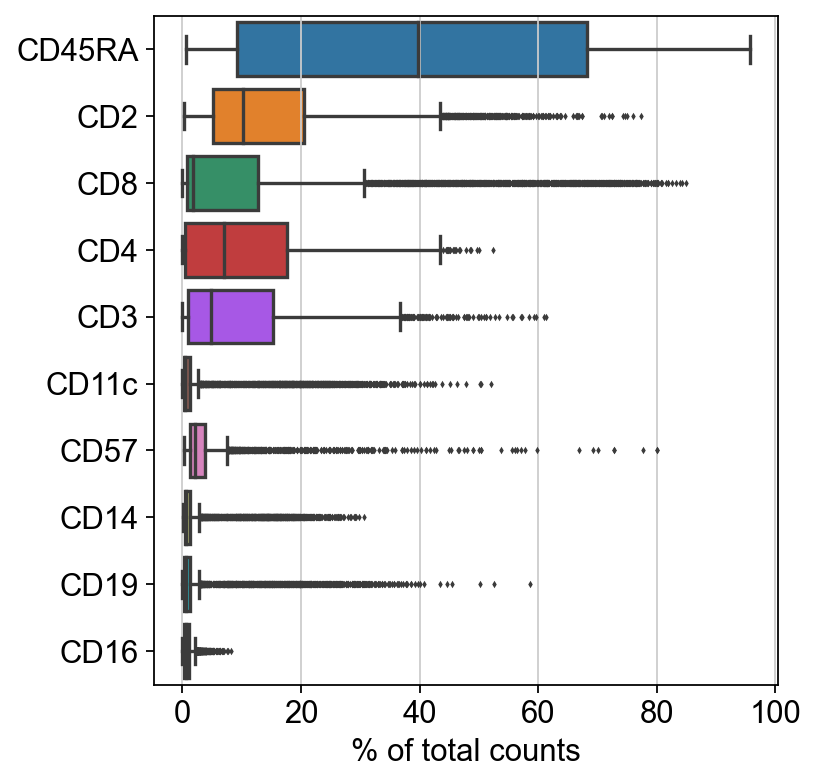

In [6]:
sc.settings.set_figure_params(dpi=80, facecolor='white')
sc.pl.highest_expr_genes(adata, n_top=20)

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\seaborn\_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\seaborn\_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\seaborn\_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\seaborn\_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))


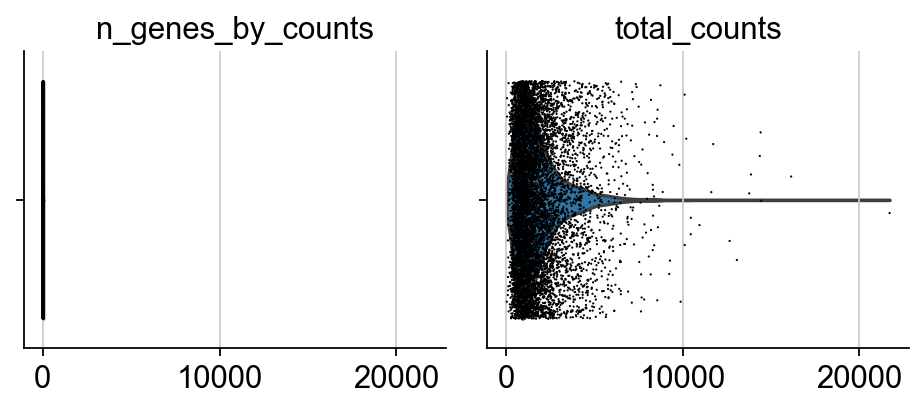

In [7]:
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'], jitter=0.4, multi_panel=True)

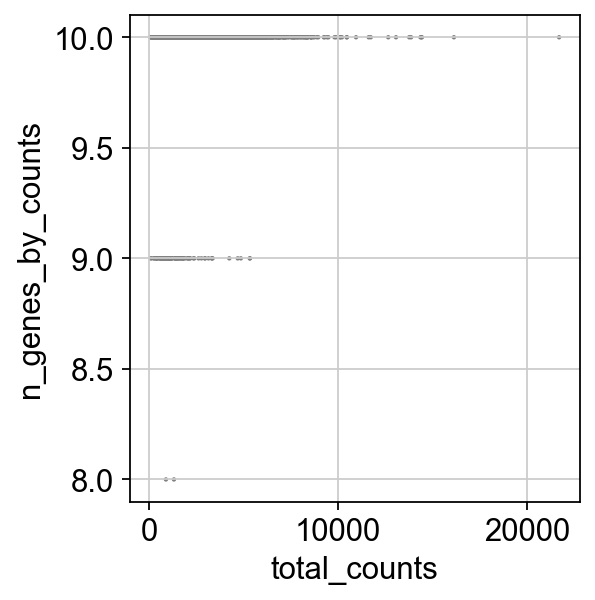

In [8]:
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [9]:
adata.var.highly_variable = True

In [10]:
#sc.pp.normalize_total(adata, target_sum=1e4)
import scipy.stats.mstats
def clr(adata):
    temp = adata.X + 1
    adata.X = np.log(temp / scipy.stats.mstats.gmean(temp, axis=1).reshape([-1, 1]))
    
clr(adata)

In [11]:
sc.pp.scale(adata, max_value=2)

In [12]:
np.isnan(adata.X).sum()

0

In [13]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    with n_comps=9
    finished (0:00:00)


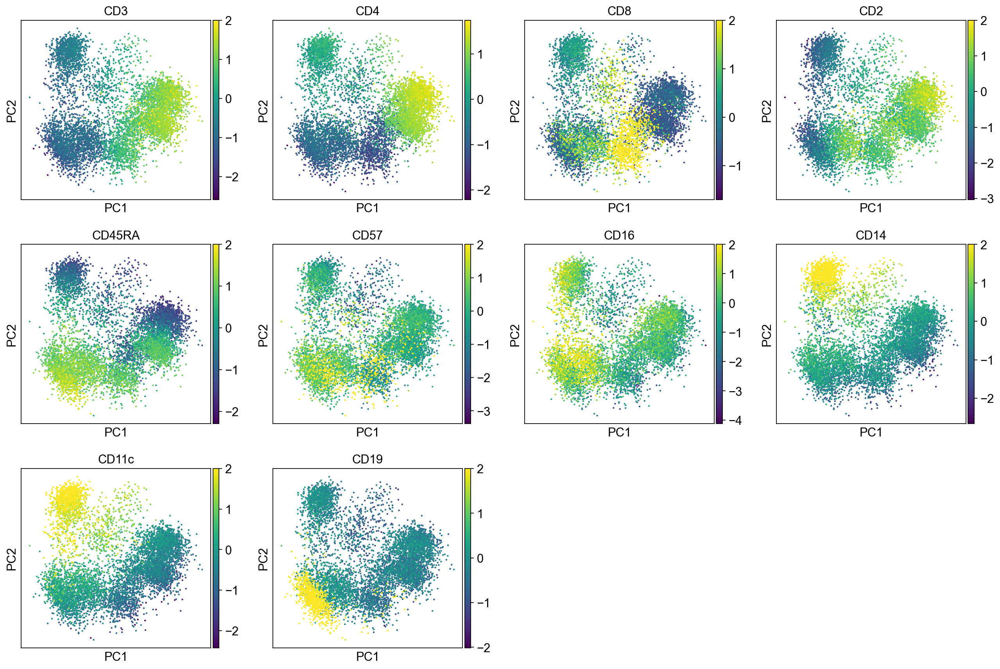

In [14]:
sc.pl.pca(adata, color=data.index)

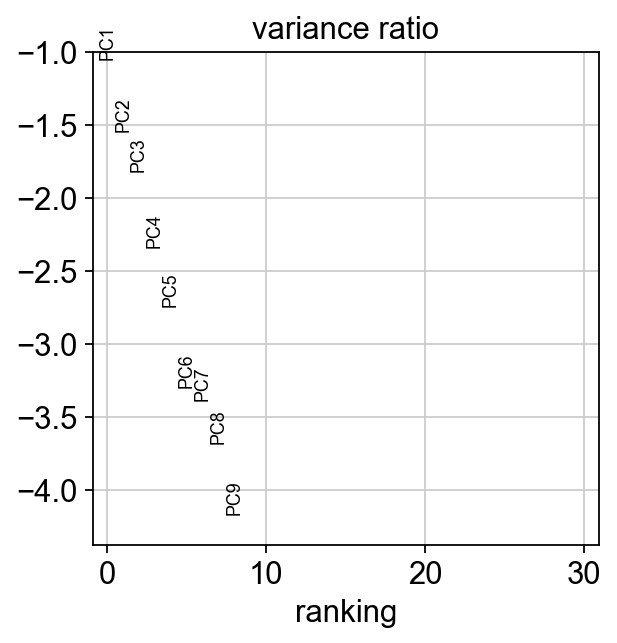

In [15]:
sc.pl.pca_variance_ratio(adata, log=True)

In [16]:
sc.pp.neighbors(adata, n_neighbors=50)
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution=2.)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:14)
running Leiden clustering
    finished: found 24 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:06)


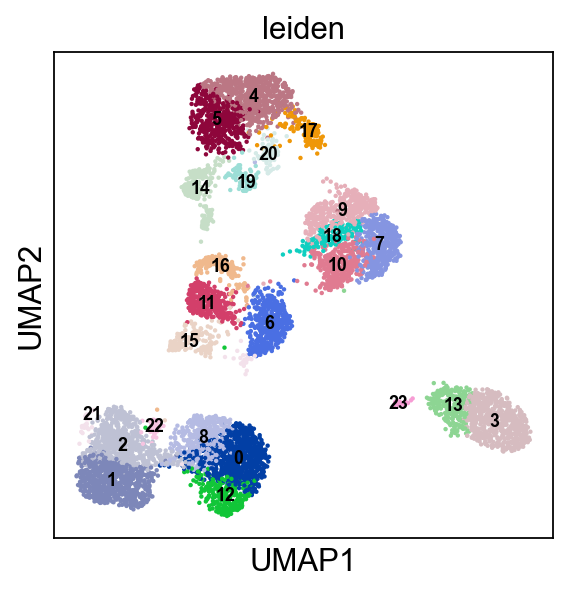

In [17]:
sc.pl.umap(adata, color=['leiden'], ncols=3, legend_loc="on data", legend_fontsize=8.)

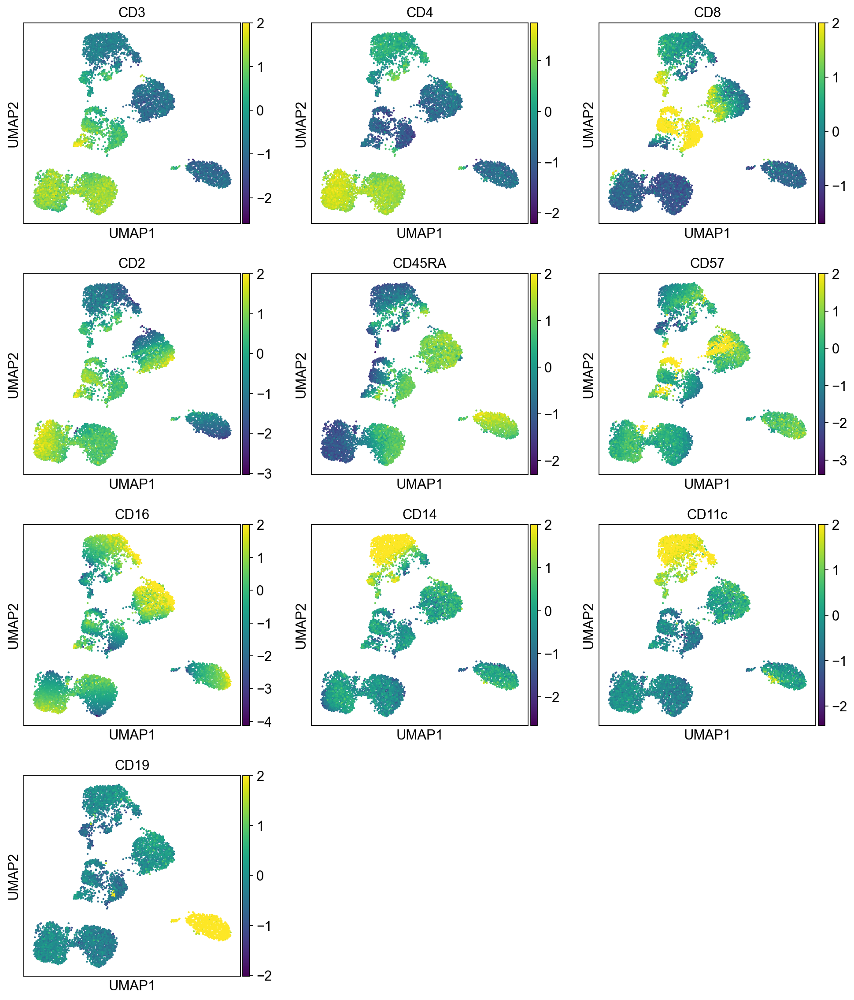

In [18]:
sc.pl.umap(adata, color=data.index, ncols=3, legend_loc="on data", legend_fontsize=8.)

In [19]:
filtered_adata = adata.copy()
proteins = filtered_adata.var.index.to_series().apply(lambda x: 'PROTEIN_' + x).tolist()
rnas = rna_adata.raw.var.index.to_series().apply(lambda x: '' + x).tolist()
merged_adata = sc.AnnData(pd.DataFrame(np.hstack([filtered_adata.X, rna_adata.raw.X]),
                                    columns=proteins+rnas))
merged_adata.obs = filtered_adata.obs
merged_adata.obsm = filtered_adata.obsm

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [20]:
#print(*merged_adata.var_names)

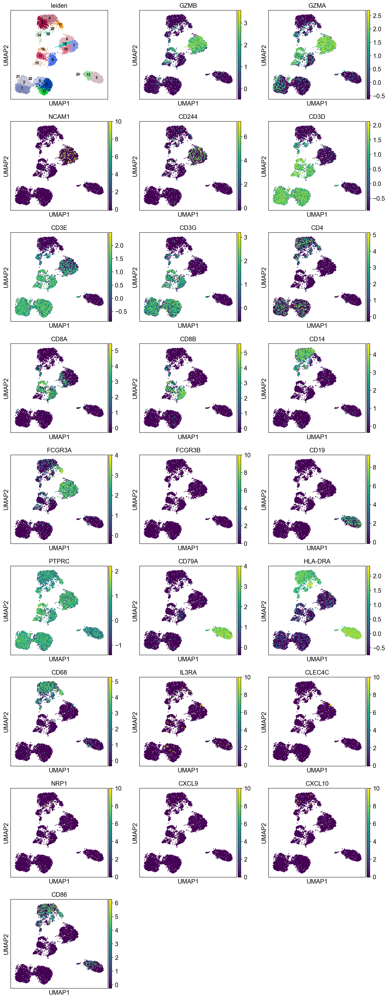

In [21]:
sc.pl.umap(merged_adata, color=['leiden', 
                         'GZMB', 'GZMA', 'NCAM1', 'CD244', # NK (Granzyme)
                         'CD3D', 'CD3E', 'CD3G', 'CD4', 'CD8A', 'CD8B', # T CD4/CD8
                         'CD14', 'FCGR3A', 'FCGR3B', # MONO CD14 / (CD16 = FCGR)
                         'CD19', 'PTPRC', 'CD79A', # B (CD45R = PTPRC)
                         'HLA-DRA', 'CD68', 'IL3RA', 'CLEC4C', 'NRP1',  # DC
                         'CXCL9', 'CXCL10', 'CD86'
                        ], ncols=3, legend_loc="on data", legend_fontsize=8.)

### B cells:
Cluster 3, 13, and 23 are classified as B cells given high CD19 expression in protein, and high *CD19* and *CD79A* in mRNA. Because cluster 23 also has high expression of CD3, and thus is annotated as "CD3+" B cells.

### T cells:
Cluster 0, 1, 2, 8, 9, 12, 21, 22 (bottom left) and cluster 6, 11, 15, 16 are clearly high in CD3, and are all T-cells.
Cluster 0, 1, 2, 8, 9, 12 are CD4 T cells;
Cluster 6, 11, 16 are CD8 T cells;
Cluster 21, 22 are CD4+ CD8+ (double positive) T cells, labeled as DP T; CD22 is also high in CD57
Cluster 15 are CD4- CD8- (double negative) T cells, labeled as DN T;

### NK cells:
Cluster 7, 9, 10, 18 are high in CD16, GZMA/B, NCAM1 (CD56), and CD244.
Cluster 18 is high in CD57.

### Monocytes
Cluster 4, 5, 14, 19, 20, 17 are high in CD11c and CD68
Cluster 4, 5, 14, 19 are high in CD14
Cluster 14 are high in CD8

In [22]:
cluster2subtype = {'0': 'CD45RA+ CD4 T', 
                '1': 'CD4 T', 
                '2': 'CD4 T', 
                '3': 'B', 
                '4': 'CD14+ CD16+ Mono', 
                '5': 'CD14+ Mono', 
                '6': 'CD8 T', 
                '7': 'NK', 
                '8': 'CD45RA+ CD4 T', 
                '9': 'NK', 
                '10': 'NK', 
                '11': 'CD8 T', 
                '12': 'CD45RA+ CD4 T', 
                '13': 'B', 
                '14': 'CD3+ CD8+ CD14+ Mono',
                '15': 'DN T',
                '16': 'CD57+ CD8 T',
                '17': 'CD16+ Mono',
                '18': 'CD57+ NK',
                '19': 'CD3+ CD14+ Mono',
                '20': 'CD14- CD16- Mono',
                '21': 'DP T',
                '22': 'CD57+ DP T',
                '23': 'CD3+ B'}

adata.obs['cell subtype'] = [cluster2subtype[i] for i in adata.obs.leiden]
filtered_adata.obs['cell subtype'] = [cluster2subtype[i] for i in adata.obs.leiden]
merged_adata.obs['cell subtype'] = [cluster2subtype[i] for i in adata.obs.leiden]

cluster2type = {'0': 'CD4 T', 
                '1': 'CD4 T', 
                '2': 'CD4 T', 
                '3': 'B', 
                '4': 'Mono', 
                '5': 'Mono', 
                '6': 'CD8 T', 
                '7': 'NK', 
                '8': 'CD4 T', 
                '9': 'NK', 
                '10': 'NK', 
                '11': 'CD8 T', 
                '12': 'CD4 T', 
                '13': 'B', 
                '14': 'Mono',
                '15': 'DN T',
                '16': 'CD8 T',
                '17': 'Mono',
                '18': 'NK',
                '19': 'Mono',
                '20': 'Mono',
                '21': 'DP T',
                '22': 'DP T',
                '23': 'B'}

adata.obs['cell type'] = [cluster2type[i] for i in adata.obs.leiden]
filtered_adata.obs['cell type'] = [cluster2type[i] for i in adata.obs.leiden]
merged_adata.obs['cell type'] = [cluster2type[i] for i in adata.obs.leiden]

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'cell subtype' as categorical
... storing 'cell type' as categorical


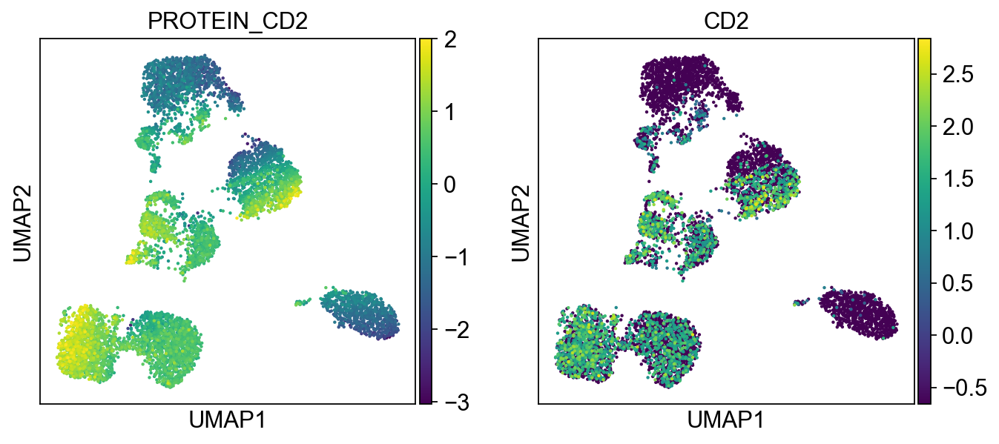

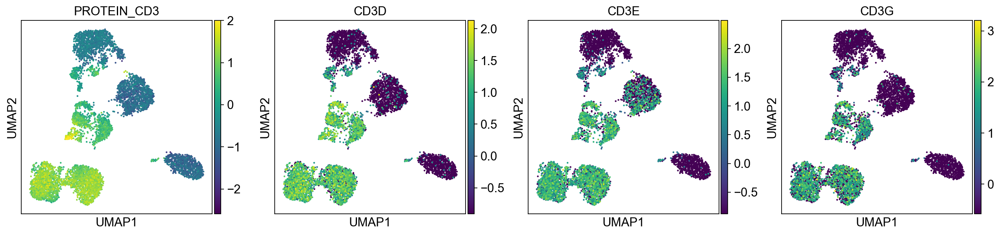

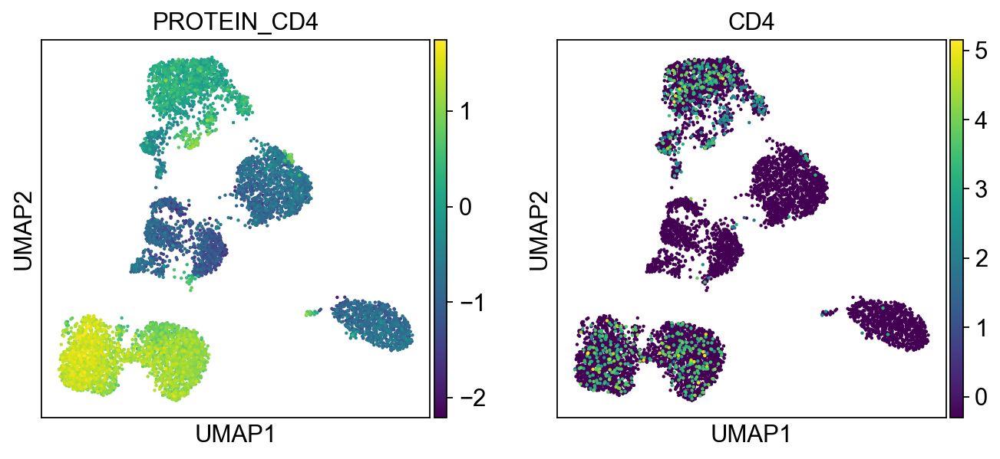

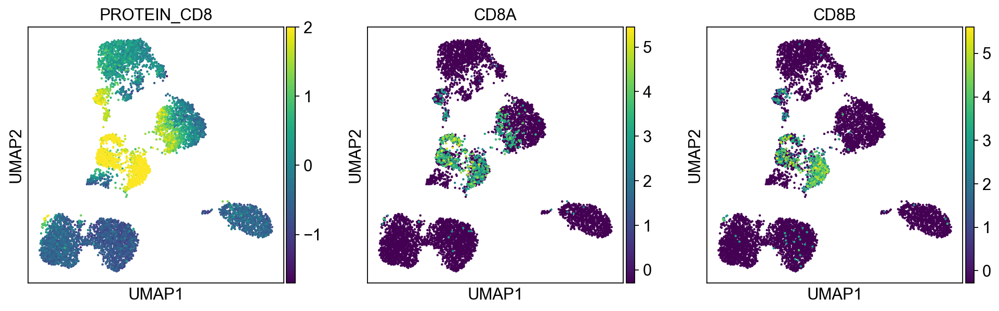

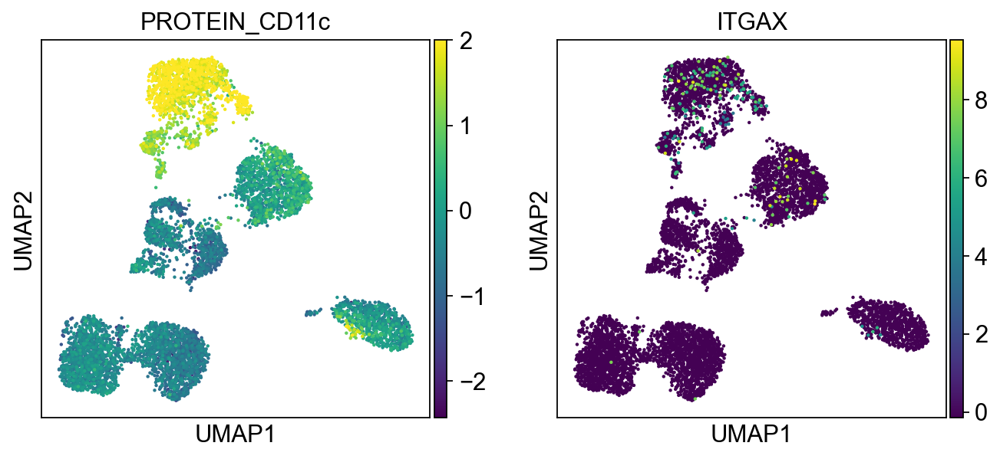

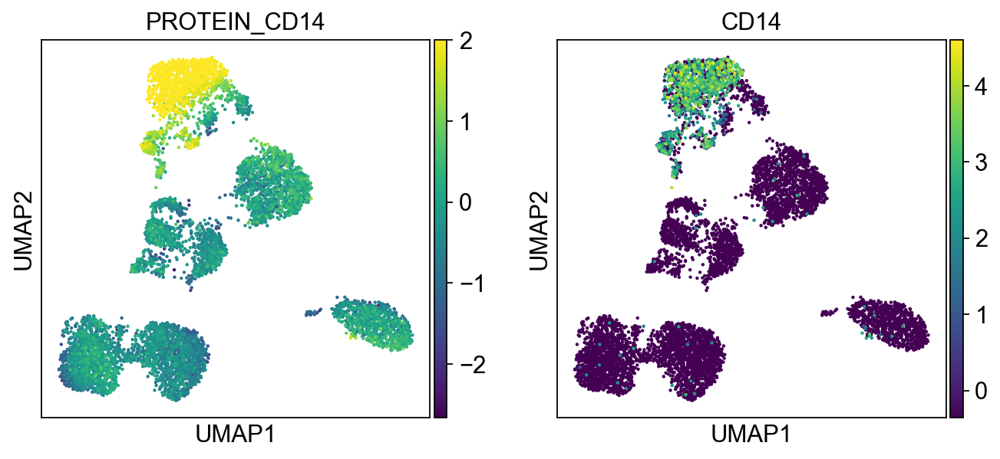

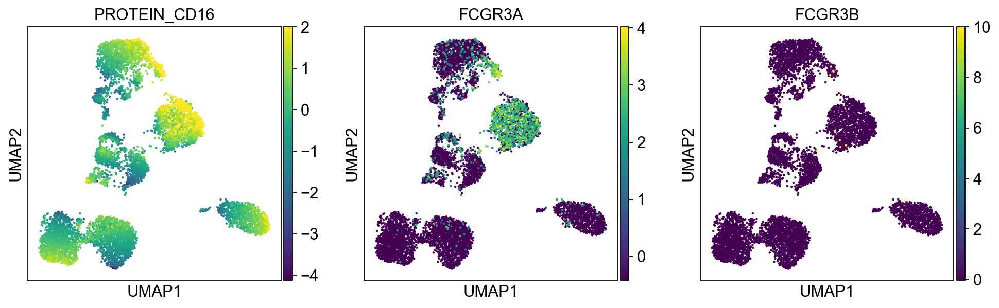

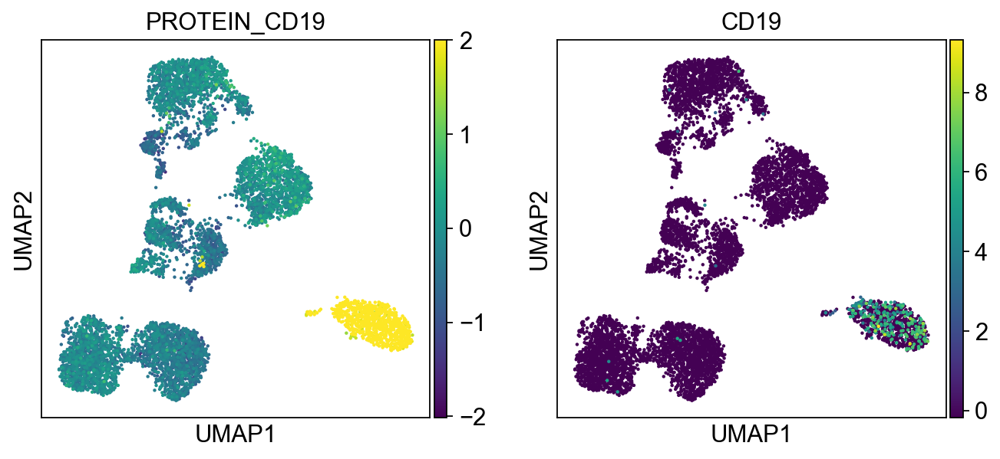

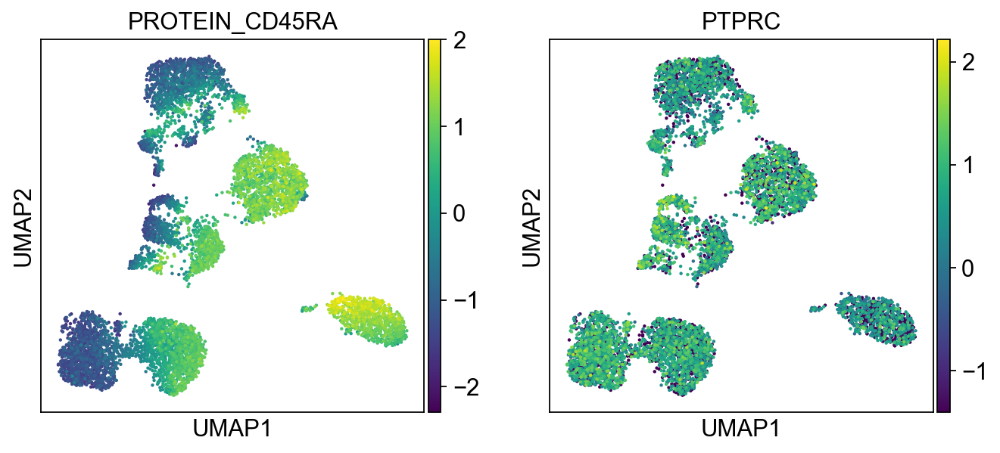

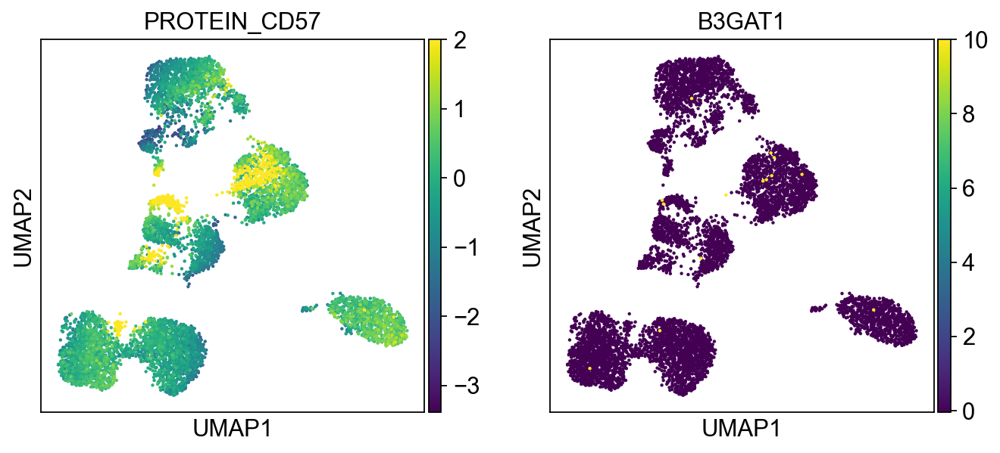

In [23]:
protein2rna = {'PROTEIN_CD2': ['CD2'],
               'PROTEIN_CD3': ['CD3D', 'CD3E', 'CD3G'],
               'PROTEIN_CD4': ['CD4'],
               'PROTEIN_CD8': ['CD8A', 'CD8B'],
               'PROTEIN_CD11c': ['ITGAX'],
               'PROTEIN_CD14': ['CD14'],
               'PROTEIN_CD16': ['FCGR3A', 'FCGR3B'],
               'PROTEIN_CD19': ['CD19'],
               'PROTEIN_CD45RA': ['PTPRC'],
               'PROTEIN_CD57': ['B3GAT1']
              }
for k, v in protein2rna.items(): 
    sc.pl.umap(merged_adata, color=[k] + v, ncols=4, legend_fontsize=8.)

... storing 'cell subtype' as categorical
... storing 'cell type' as categorical


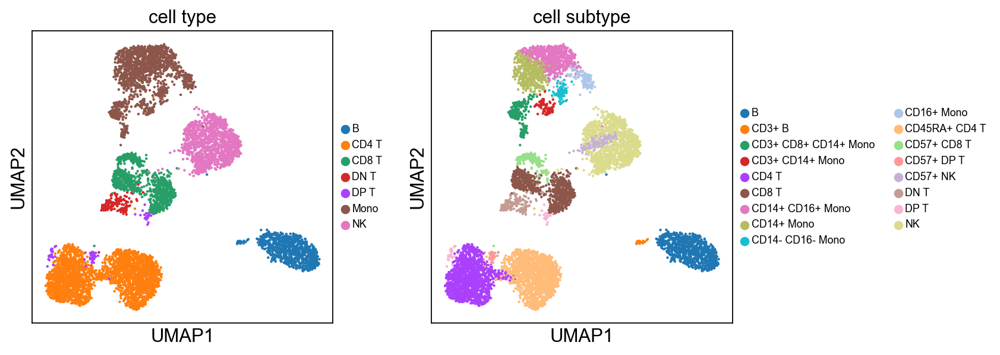

In [24]:
sc.pl.umap(adata, color=['cell type', 'cell subtype'], ncols=4, legend_fontsize=8.)

In [26]:
protein2rna = {'PROTEIN_CD2': ['CD2'],
               'PROTEIN_CD3': ['CD3D', 'CD3E', 'CD3G'],
               'PROTEIN_CD4': ['CD4'],
               'PROTEIN_CD8': ['CD8A', 'CD8B'],
               'PROTEIN_CD11c': ['ITGAX'],
               'PROTEIN_CD14': ['CD14'],
               'PROTEIN_CD16': ['FCGR3A', 'FCGR3B'],
               'PROTEIN_CD19': ['CD19'],
               'PROTEIN_CD45RA': ['PTPRC'],
               'PROTEIN_CD57': ['B3GAT1']
              }
must_keep = np.zeros(rna_adata.X.shape[1])
for k, v in protein2rna.items():
    for i in v:
        must_keep[rna_adata.var_names.get_loc(i)] = 1.

In [27]:
import sys
sys.path.insert(0,'..')
import compactmarker

model = compactmarker.UmapL1(lasso=5e-4, ridge=0., n_pcs=None, perplexity=100., use_beta_in_Q=True, n_threads=6, 
                             max_outer_iter=2) # , max_inner_iter=1, max_outer_iter=1
model.fit(rna_adata.X, X_teacher=filtered_adata.X, must_keep=must_keep)

Calculating distance matrix and scaling factors...
Computing pairwise distances...
Using 6 threads...
Mean value of sigma: 0.362250
Done. Elapsed time: 52.68 seconds. Total: 52.68 seconds.
Creating model without batches...
Optimizing using OWLQN (because lasso is nonzero)...
0 loss: 12.988180160522461 Nonzero: 26 Elapsed time: 509.05 seconds. Total: 561.73 seconds.
1 loss: 3.859959602355957 Nonzero: 26 Elapsed time: 499.09 seconds. Total: 1060.82 seconds.
final loss: 3.821873903274536 Nonzero: 26 Elapsed time: 7.48 seconds. Total: 1068.30 seconds.


In [28]:
print(*rna_adata.var_names[model.get_mask()])

AIF1 B2M B3GAT1 CD14 CD19 CD2 CD3D CD3E CD3G CD4 CD7 CD74 CD79A CD8A CD8B CST3 CSTA CYBA FCER1G FCGR3A FCGR3B GNLY GZMB HLA-DPA1 HLA-DRA ITGAX KLRB1 LGALS1 LST1 LYZ MS4A1 NKG7 PTPRC RPL13 S100A4 S100A6 S100A8 S100A9 TRBC2 TYROBP


In [41]:
rna_adata.var_names[model.get_mask()].shape

(40,)

In [46]:
print(*rna_adata.var_names[model.get_mask()])

AIF1 CD7 CD74 CD79A CD8B CST7 CTSS FCER1G GNLY HLA-DPA1 HLA-DRA HLA-DRB1 IL32 LEF1 LGALS1 LST1 LYZ NKG7 PRF1 RPL13 S100A11 S100A4 S100A8 S100A9 TRBC2 TYROBP


In [29]:
rnas = rna_adata.raw.var.index.to_series().apply(lambda x: '' + x).tolist()
merged_adata2 = rna_adata.copy()

protein_markers = ['PROTEIN_' + i for i in filtered_adata.var.index]

for i, marker in enumerate(filtered_adata.var.index.tolist()):
    merged_adata2.obs['PROTEIN_' + marker] = filtered_adata.X[:, i]

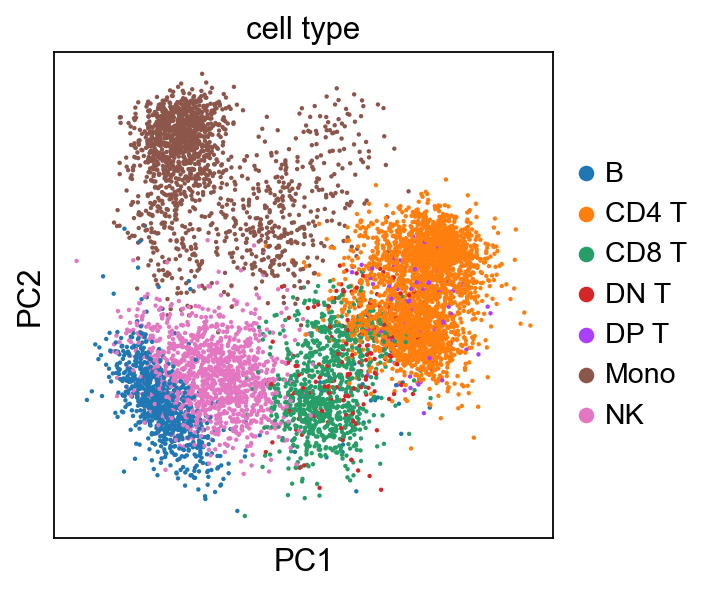

In [30]:
sc.pl.pca(adata, color='cell type')

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
Trying to set attribute `.obs` of view, copying.


computing PCA
    on highly variable genes
    with n_comps=38
    finished (0:00:00)


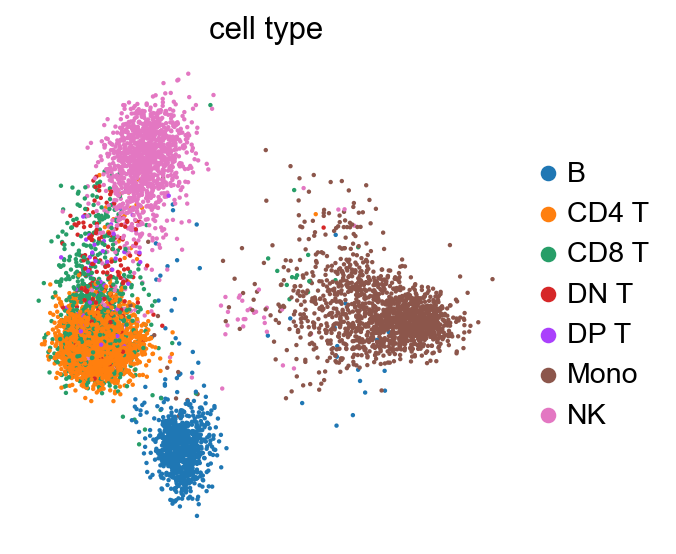

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


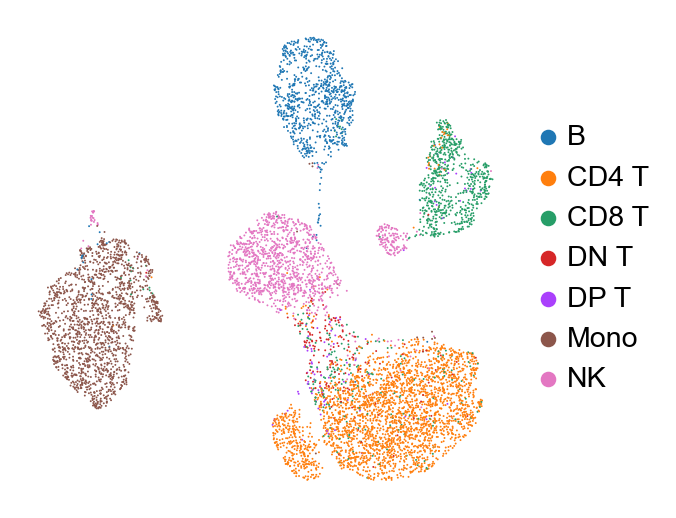

In [31]:
new_adata = model.transform(merged_adata2.copy())
new_adata.obs['cell type'] = filtered_adata.obs['cell type']
new_adata.obs['cell subtype'] = filtered_adata.obs['cell subtype']

sc.tl.pca(new_adata, svd_solver='arpack')
sc.pl.pca(new_adata, color='cell type', frameon=False)
sc.pp.neighbors(new_adata, n_pcs=5, use_rep="X_pca")
sc.tl.umap(new_adata)

sc.pl.umap(new_adata, color=['cell type'], frameon=False, title="", size=3.)

In [32]:
new_adata

AnnData object with n_obs × n_vars = 7634 × 40
    obs: 'cell subtype', 'cell type', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'PROTEIN_CD3', 'PROTEIN_CD4', 'PROTEIN_CD8', 'PROTEIN_CD2', 'PROTEIN_CD45RA', 'PROTEIN_CD57', 'PROTEIN_CD16', 'PROTEIN_CD14', 'PROTEIN_CD11c', 'PROTEIN_CD19'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell subtype_colors', 'cell type_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

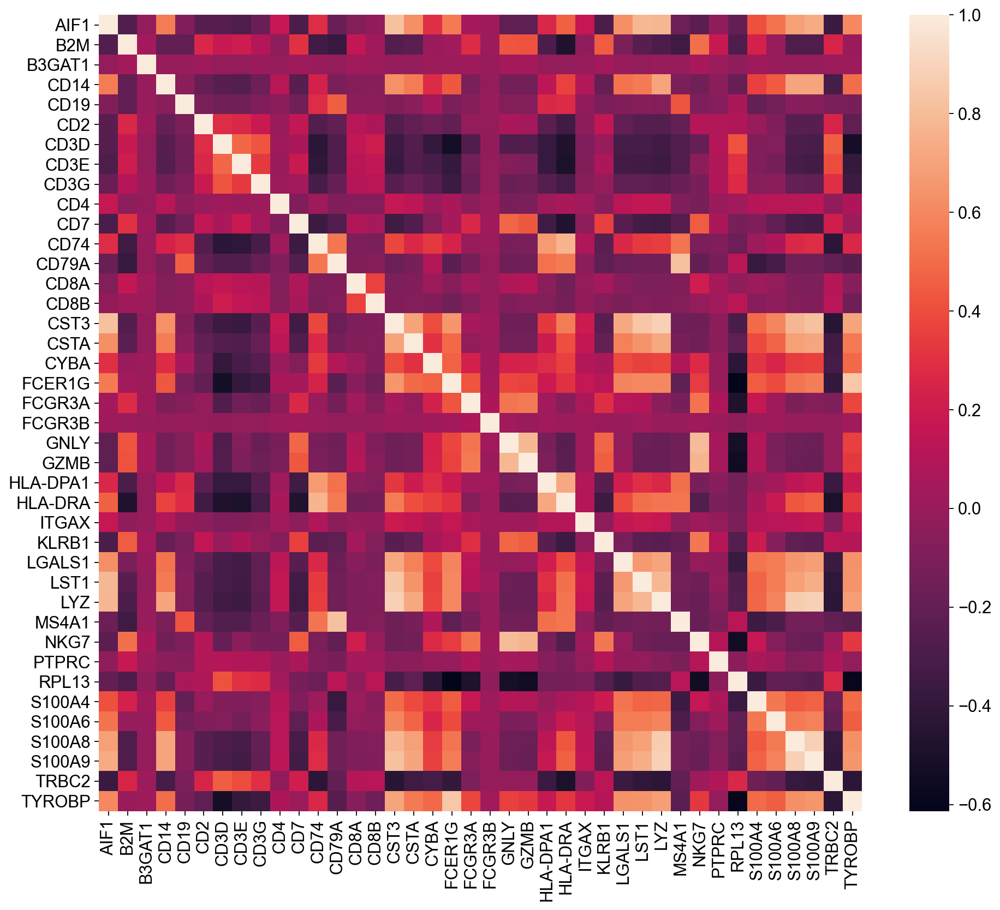

Text(0.5, 1.0, 'Distribution of correlations of \n selected markers')

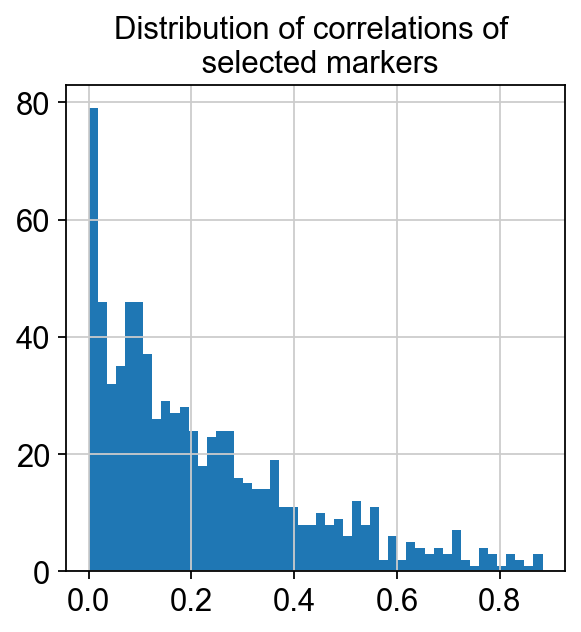

In [33]:
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

df = pd.DataFrame(new_adata.X, columns=new_adata.var.index)

corrMatrix = df.corr()

fig, ax = plt.subplots(figsize=(14, 12))
sn.heatmap(ax=ax, data=corrMatrix, xticklabels=True, yticklabels=True)
plt.show()

corr_matrix = corrMatrix.values
corr_matrix = np.abs(corr_matrix)

corr_values = []

for i in range(corr_matrix.shape[0]):
    for j in range(i):
        corr_values.append(corr_matrix[i, j])
        
plt.hist(corr_values, bins=50)
plt.title('Distribution of correlations of \n selected markers')

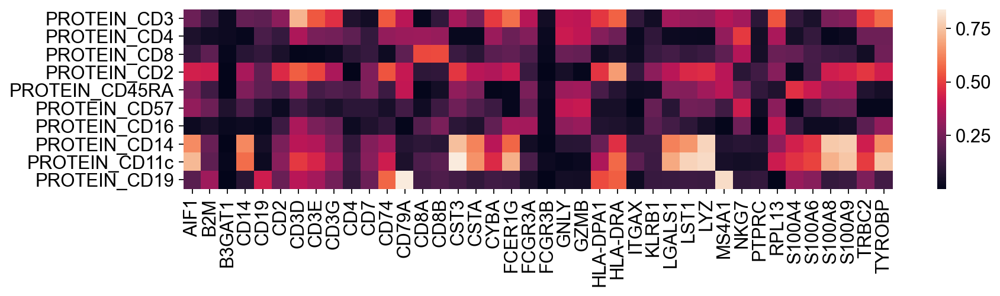

In [38]:
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

df2 = pd.concat([df.reset_index(drop=True), 
                new_adata.obs.loc[:, new_adata.obs.columns.str.contains('PROTEIN_')].reset_index(drop=True)], 
               axis=1)

corrMatrix = df2.corr()
corrMatrix = corrMatrix.loc[corrMatrix.index.str.contains('PROTEIN_'), ~corrMatrix.index.str.contains('PROTEIN_')]

fig, ax = plt.subplots(figsize=(12, 2.5))
sn.heatmap(ax=ax, data=corrMatrix.abs(), xticklabels=True, yticklabels=True)
plt.show()

In [35]:
corrMatrix.T.style

,PROTEIN_CD3,PROTEIN_CD4,PROTEIN_CD8,PROTEIN_CD2,PROTEIN_CD45RA,PROTEIN_CD57,PROTEIN_CD16,PROTEIN_CD14,PROTEIN_CD11c,PROTEIN_CD19
AC132872.2,-0.057121,-0.033678,0.022242,-0.026684,0.015539,0.021639,0.023311,0.033757,0.043185,0.003818
AP1G2,0.003806,-0.007512,-0.019456,0.014663,0.041407,0.014168,-0.009372,-0.050276,-0.045060,0.024469
APEH,-0.001326,0.003457,-0.013882,0.018534,0.027218,0.025875,0.024947,-0.045393,-0.023549,-0.005811
C2orf68,0.004219,0.018819,-0.013954,-0.001032,0.005328,-0.008308,0.006165,-0.006577,0.008854,-0.013827
CBLB,-0.017304,-0.055466,0.036698,0.061028,0.052467,0.016983,-0.003008,-0.053712,-0.036736,-0.016574
CD320,-0.004388,-0.068123,0.056684,0.080928,0.054757,0.083013,0.011571,-0.081302,-0.082888,-0.041756
CD59,0.067997,0.059027,-0.028081,0.077722,-0.031213,0.019404,-0.022022,-0.075959,-0.082218,-0.006978
CD82,-0.006573,0.022886,-0.110960,0.015401,0.015857,0.007061,-0.057523,-0.079809,-0.074393,0.204989
CDK10,-0.005229,-0.007795,-0.001334,0.029529,0.023666,0.009640,0.004888,-0.038625,-0.018294,-0.003952
CITED4,0.124631,0.112310,-0.043116,0.060291,-0.018634,-0.096972,-0.061113,-0.042644,-0.035454,-0.102378


In [36]:
print(*(i for i in corrMatrix.T.index))

AC132872.2 AP1G2 APEH C2orf68 CBLB CD320 CD59 CD82 CDK10 CITED4 CNOT11 COA5 COMMD10 CRYL1 CST3 DOCK9 DPH5 FCN1 GABPB1-AS1 GMPR2 GPANK1 HSD17B8 KIN KRTCAP3 LINC00402 LYZ MRPL46 NAGPA NAT9 NDEL1 NKAP POLDIP2 PPP1R3E PPP1R8 RIF1 RNF19A SCAMP3 SLC2A4RG SNHG17 SSR3 TMEM245 TOR1AIP1 USP8 VPS26B WDR73 XXbac-BPG299F13.17 ZBTB1 ZBTB20


In [37]:
#adata.obs.to_csv("../../CITE-seq/human-pbmc-cell.csv")

In [52]:
#weight_df = pd.DataFrame(model.w[model.w > 0.], index=rna_adata.var_names[model.w > 0.])
#weight_df.to_pickle("cite-seq-26-weights.pkl")
#weight_df.to_csv("cite-seq-26-weigths.csv")

In [56]:
#merged_adata.write_loom("cite-seq.loom")

The loom file will lack these fields:
{'X_umap', 'X_pca'}
Use write_obsm_varm=True to export multi-dimensional annotations
